In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import math
from pylab import *
import glob
import pickle
%matplotlib inline


In [2]:
file = open('cam_calib_imgpoints_objpoints.pkl', 'rb')
imgpoints = pickle.load(file)
objpoints = pickle.load(file)

In [3]:
# TODO: Write a function that takes an image, object points, and image points
# performs the camera calibration, image distortion correction and 
# returns the undistorted image
def cal_undistort(img, objpoints, imgpoints):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2:], None, None)   
    return cv2.undistort(img, mtx, dist, None, mtx)

In [4]:
def compare_images(img1, img2, text1 = 'img1', text2 = 'img2'):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(48, 18))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title(text1, fontsize=40)
    ax2.imshow(img2)
    ax2.set_title(text2, fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [5]:
def adjust_gamma(image, gamma=1.0):
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255
        for i in np.arange(0, 256)]).astype("uint8")

    # apply gamma correction using the lookup table
    return cv2.LUT(image, table)


In [6]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

In [7]:
def region_of_interest(img):
    """
    Applies an image mask.
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    imshape = img.shape
    vertices = np.array([[(240,720), (240, 10), (1100, 10), (1100, 720)]], dtype=np.int32) #677
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


In [8]:
def corners_unwarp(img, objpoints, imgpoints):

    # 1) Undistort using mtx and dist
    undistorted_img = cal_undistort(img, objpoints, imgpoints)
    img_size = img.shape
    shape = (img_size[1], img_size[0])
    w = 1280
    
    src = np.array([[550, 475],
                    [735, 475],
                    [245, 684],
                    [1050, 684]], np.float32)

    dst = np.array([[320, 0],
                    [926, 0],
                    [320,720],
                    [920, 720]], np.float32)

    # d)cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)

    # e) use cv2.warpPerspective() to warp your image to a top-down view
    gray = cv2.warpPerspective(undistorted_img, M,  shape, flags = cv2.INTER_LINEAR )
    return region_of_interest(gray)
    #return gray

In [9]:
def corners_warp(img, objpoints, imgpoints):

    # 1) Undistort using mtx and dist
    undistorted_img = cal_undistort(img, objpoints, imgpoints)
    img_size = img.shape
    shape = (img_size[1], img_size[0])
    
    dst = np.array([[550, 475],
                    [735, 475],
                    [245, 684],
                    [1050, 684]], np.float32)
    
    src = np.array([[320, 0],
                    [926, 0],
                    [320,720],
                    [920, 720]], np.float32)
    
    


    # d)cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)

    # e) use cv2.warpPerspective() to warp your image to a top-down view
    gray = cv2.warpPerspective(undistorted_img, M,  shape, flags = cv2.INTER_LINEAR )
    return region_of_interest(gray)

In [10]:
def compare_images5(img1, img2, img3, img4,img5, text1 = 'img1', text2 = 'img2', text3 = 'img3', text4 = 'img4', text5 = 'img5'):
    f, (ax1, ax2,ax3,ax4, ax5) = plt.subplots(1, 5, figsize=(48, 18))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title(text1, fontsize=40)
    ax2.imshow(img2)
    ax2.set_title(text2, fontsize=40)
    ax3.imshow(img3)
    ax3.set_title(text3, fontsize=40)
    ax4.imshow(img4)
    ax4.set_title(text4, fontsize=40)
    ax5.imshow(img5)
    ax5.set_title(text5, fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

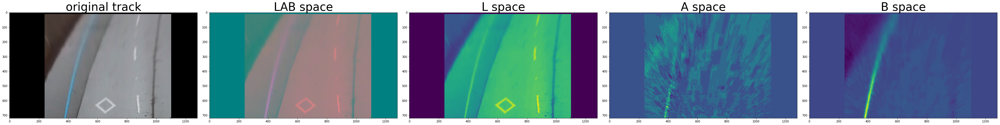

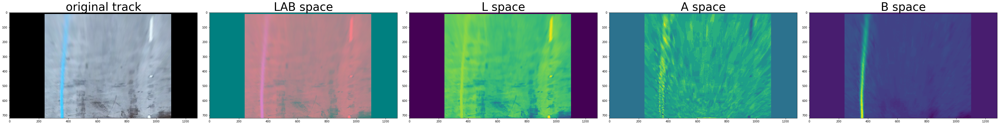

In [11]:
thresh = (175, 255)

img1 = cv2.imread('test_images/test8.jpg')
img1 = cv2.resize(img1, (1280, 720)) 
undistorted1 = cal_undistort(img1, objpoints, imgpoints)
unwraped1 = corners_unwarp(undistorted1, objpoints, imgpoints)

img2 = cv2.imread('test_images/test1.jpg')
img2 = cv2.resize(img2, (1280, 720)) 
undistorted2 = cal_undistort(img2, objpoints, imgpoints)
unwraped2 = corners_unwarp(undistorted2, objpoints, imgpoints)

LAB1 = cv2.cvtColor(unwraped1, cv2.COLOR_BGR2LAB)
L1 = LAB1[:,:,0]
A1 = LAB1[:,:,1]
B1 = LAB1[:,:,2]
compare_images5(unwraped1, LAB1, L1,A1,B1, text1= 'original track', text2 = 'LAB space', text3 = 'L space', text4='A space', text5 = 'B space')


LAB2 = cv2.cvtColor(unwraped2, cv2.COLOR_BGR2LAB)
L2 = LAB2[:,:,0]
A2 = LAB2[:,:,1]
B2 = LAB2[:,:,2]
compare_images5(unwraped2,LAB2, L2,A2,B2, text1= 'original track', text2 = 'LAB space', text3 = 'L space', text4='A space', text5 = 'B space')

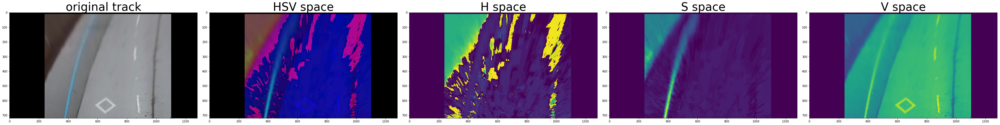

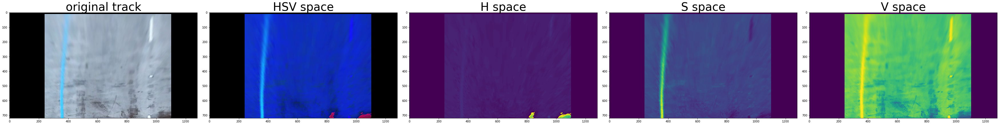

In [12]:
HSV1 = cv2.cvtColor(unwraped1, cv2.COLOR_BGR2HSV)
H1 = HSV1[:,:,0]
S1 = HSV1[:,:,1]
V1 = HSV1[:,:,2]
compare_images5(unwraped1, HSV1, H1,S1,V1, text1= 'original track', text2 = 'HSV space', text3 = 'H space', text4='S space', text5 = 'V space')


HSV2 = cv2.cvtColor(unwraped2, cv2.COLOR_BGR2HSV)
H2 = HSV2[:,:,0]
S2 = HSV2[:,:,1]
V2 = HSV2[:,:,2]
compare_images5(unwraped2, HSV2, H2,S2,V2, text1= 'original track', text2 = 'HSV space', text3 = 'H space', text4='S space', text5 = 'V space')

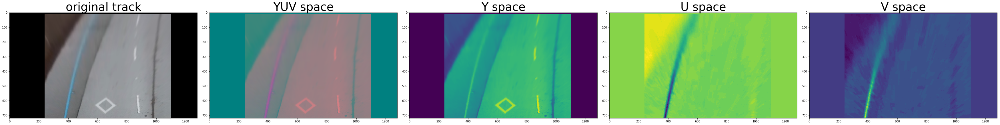

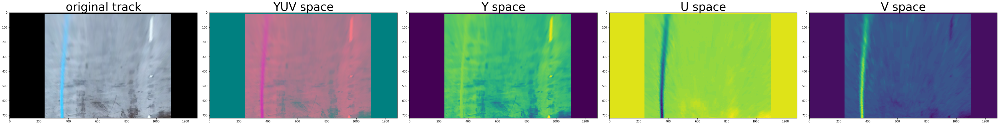

In [13]:
YUV1 = cv2.cvtColor(unwraped1, cv2.COLOR_BGR2YUV)
Y1 = YUV1[:,:,0]
U1 = YUV1[:,:,1]
V1 = YUV1[:,:,2]
compare_images5(unwraped1, YUV1, Y1,U1,V1, text1= 'original track', text2 = 'YUV space', text3 = 'Y space', text4='U space', text5 = 'V space')


YUV2 = cv2.cvtColor(unwraped2, cv2.COLOR_BGR2YUV)
Y2 = YUV2[:,:,0]
U2 = YUV2[:,:,1]
V2 = YUV2[:,:,2]
compare_images5(unwraped2, YUV2, Y2,U2,V2, text1= 'original track', text2 = 'YUV space', text3 = 'Y space', text4='U space', text5 = 'V space')

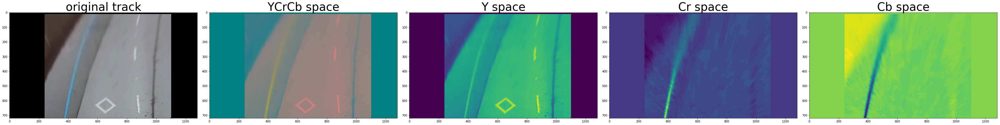

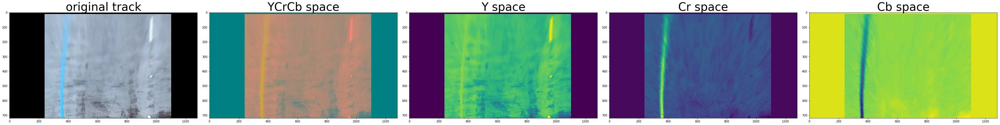

In [14]:
YCrCb1 = cv2.cvtColor(unwraped1, cv2.COLOR_BGR2YCrCb)
Y1,Cr1,Cb1 = cv2.split(YCrCb1)
compare_images5(unwraped1, YCrCb1, Y1,Cr1,Cb1, text1= 'original track', text2 = 'YCrCb space', text3 = 'Y space', text4='Cr space', text5 = 'Cb space')

YCrCb2 = cv2.cvtColor(unwraped2, cv2.COLOR_BGR2YCrCb)
Y2,Cr2,Cb2 = cv2.split(YCrCb2)
compare_images5(unwraped2, YCrCb2, Y2, Cr2, Cb2, text1= 'original track', text2 = 'YCrCb space', text3 = 'Y space', text4='Cr space', text5 = 'Cb space')


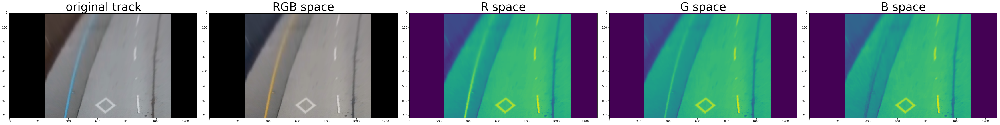

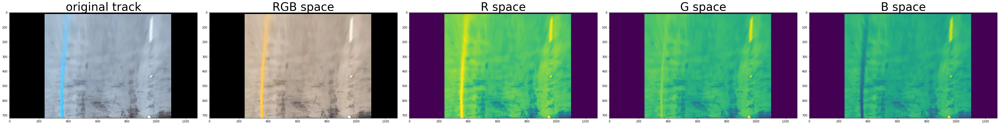

In [15]:
RGB1 = cv2.cvtColor(unwraped1, cv2.COLOR_BGR2RGB)
R1,G1,B1 = cv2.split(RGB1)
compare_images5(unwraped1, RGB1, R1,G1,B1, text1= 'original track', text2 = 'RGB space', text3 = 'R space', text4='G space', text5 = 'B space')


RGB2 = cv2.cvtColor(unwraped2, cv2.COLOR_BGR2RGB)
R2,G2,B2 = cv2.split(RGB2)
compare_images5(unwraped2, RGB2, R2,G2,B2, text1= 'original track', text2 = 'RGB space', text3 = 'R space', text4='G space', text5 = 'B space')


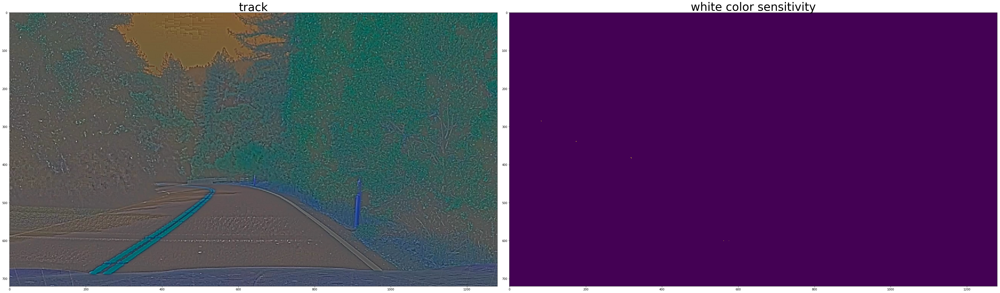

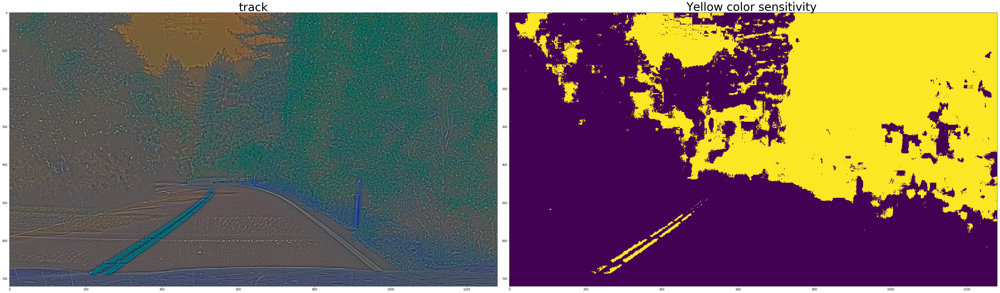

In [122]:
image = cv2.imread('test_images/h_test10.jpg')
image = cv2.resize(image, (1280, 720))
unwraped = corners_unwarp(image, objpoints, imgpoints)
unwraped1 = local_normalize(image)


unwraped3 = adjust_gamma(unwraped1, gamma = 1)
hsv = cv2.cvtColor(unwraped3, cv2.COLOR_BGR2HSV)

# define range of white color in HSV
lower_white = np.array([0,0,220])
upper_while = np.array([255,255,255])

# Threshold the HSV image to get only blue colors
mask_white = cv2.inRange(hsv, lower_white, upper_while)

compare_images(unwraped3, mask_white, text1 = 'track', text2 = 'white color sensitivity')

LAB2 = cv2.cvtColor(unwraped3, cv2.COLOR_BGR2LAB)

L = LAB2[:,:,0]
A = LAB2[:,:,1]
B = LAB2[:,:,2]

binary = np.zeros_like(A)
binary[(A > 0) & (A <= 123)] = 1
compare_images(unwraped3, binary, text1 = 'track', text2 = 'Yellow color sensitivity ')

In [99]:
#reffered from https://stackoverflow.com/questions/43240604/python-local-normalization-in-opencv

def local_normalize(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    gray,u,v = cv2.split(gray)
    float_gray = gray.astype(np.float32) / 255.0

    blur = cv2.GaussianBlur(float_gray, (0, 0), sigmaX=2, sigmaY=2)
    num = float_gray - blur

    blur = cv2.GaussianBlur(num*num, (0, 0), sigmaX=20, sigmaY=20)
    den = cv2.pow(blur, 0.5)

    gray = num / den

    cv2.normalize(gray, dst=gray, alpha=0.0, beta=1.0, norm_type=cv2.NORM_MINMAX)
    gray = gray*255
    gray = gray.astype(np.uint8)
    yuv = cv2.merge((gray,u,v))
    return cv2.cvtColor(yuv, cv2.COLOR_YUV2BGR)

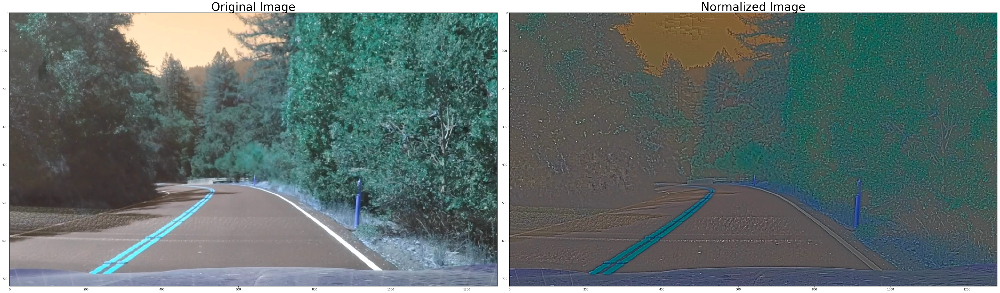

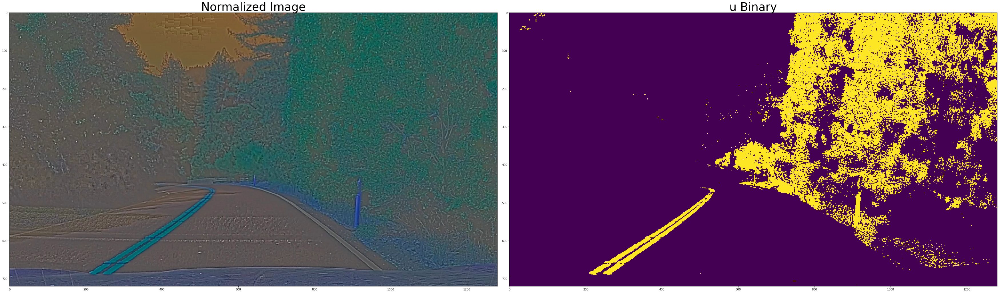

In [123]:
def yuv_select(img, thresh=(0, 200)):
    yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    u_channel = yuv[:,:,1]
    y, u, v = cv2.split(yuv)
    binary_output = np.zeros_like(u_channel)
    binary_output[(u_channel > thresh[0]) & (u_channel <= thresh[1])] = 1
    return binary_output


image = cv2.imread('test_images/h_test10.jpg')
image = cv2.resize(image, (1280, 720))
unwraped = corners_unwarp(image, objpoints, imgpoints)
unwraped1 = local_normalize(image)
unwraped1 = adjust_gamma(unwraped1, gamma = 0.5)
yuv_binary = yuv_select(unwraped1, thresh=(0, 118))

compare_images(image, local_normalize(image), text1 = 'Original Image', text2 = 'Normalized Image')
compare_images(local_normalize(image), yuv_binary, text1 = 'Normalized Image', text2 = 'u Binary')
